### Import Libraries

In [1]:
import re 
import nltk
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore', category = Warning)

In [2]:
pd.set_option('display.max_colwidth', 200)

In [3]:
train = pd.read_csv('train.csv', encoding='utf-8')
train

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run
1,2,0,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦
4,5,0,factsguide: society now #motivation
...,...,...,...
31957,31958,0,ate @user isz that youuu?ðððððððððâ¤ï¸
31958,31959,0,to see nina turner on the airwaves trying to wrap herself in the mantle of a genuine hero like shirley chisolm. #shame #imwithher
31959,31960,0,listening to sad songs on a monday morning otw to work is sad
31960,31961,1,"@user #sikh #temple vandalised in in #calgary, #wso condemns act"


In [4]:
test = pd.read_csv('test_tweets.csv', encoding='utf-8')
test

,id,tweet
0,31963,#studiolife #aislife #requires #passion #dedication #willpower to find #newmaterialsâ¦
1,31964,@user #white #supremacists want everyone to see the new â #birdsâ #movie â and hereâs why
2,31965,safe ways to heal your #acne!! #altwaystoheal #healthy #healing!!
3,31966,"is the hp and the cursed child book up for reservations already? if yes, where? if no, when? ððð #harrypotter #pottermore #favorite"
4,31967,"3rd #bihday to my amazing, hilarious #nephew eli ahmir! uncle dave loves you and missesâ¦"
...,...,...
17192,49155,thought factory: left-right polarisation! #trump #uselections2016 #leadership #politics #brexit #blm &gt;3
17193,49156,feeling like a mermaid ð #hairflip #neverready #formal #wedding #gown #dresses #mermaid â¦
17194,49157,"#hillary #campaigned today in #ohio((omg)) &amp; used words like ""assets&amp;liability"" never once did #clinton say thee(word) #radicalization"
17195,49158,"happy, at work conference: right mindset leads to culture-of-development organizations #work #mindset"


### Data Inspection

Number of tweets non racist or non sexist:

In [5]:
train[train['label'] == 0]

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run
1,2,0,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦
4,5,0,factsguide: society now #motivation
...,...,...,...
31956,31957,0,off fishing tomorrow @user carnt wait first time in 2 years
31957,31958,0,ate @user isz that youuu?ðððððððððâ¤ï¸
31958,31959,0,to see nina turner on the airwaves trying to wrap herself in the mantle of a genuine hero like shirley chisolm. #shame #imwithher
31959,31960,0,listening to sad songs on a monday morning otw to work is sad


Number of tweets racist or sexist:

In [6]:
train[train['label'] == 1]

,id,label,tweet
13,14,1,@user #cnn calls #michigan middle school 'build the wall' chant '' #tcot
14,15,1,no comment! in #australia #opkillingbay #seashepherd #helpcovedolphins #thecove #helpcovedolphins
17,18,1,retweet if you agree!
23,24,1,@user @user lumpy says i am a . prove it lumpy.
34,35,1,it's unbelievable that in the 21st century we'd need something like this. again. #neverump #xenophobia
...,...,...,...
31934,31935,1,lady banned from kentucky mall. @user #jcpenny #kentucky
31946,31947,1,@user omfg i'm offended! i'm a mailbox and i'm proud! #mailboxpride #liberalisme
31947,31948,1,@user @user you don't have the balls to hashtag me as a but you say i am to weasel away.. lumpy tony.. dipshit.
31948,31949,1,"makes you ask yourself, who am i? then am i anybody? until ....god . oh thank you god!"


In [7]:
train.label.value_counts()

0    29720
1     2242
Name: label, dtype: int64

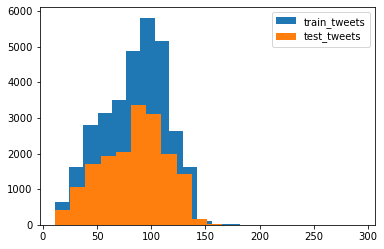

In [8]:
length_train = train['tweet'].str.len()
length_test = test['tweet'].str.len()

plt.hist(length_train, bins = 20, label = 'train_tweets')
plt.hist(length_test, bins = 20, label = 'test_tweets')
plt.legend()
plt.show()

### Data Cleaning

In [9]:
combi = train.append(test, ignore_index=True)
combi.shape

(49159, 3)

Function to remove unwanted text patterns from the tweets:

In [10]:
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
        
    return input_txt

We will use four steps to clean raw data:

1) Remove Tweeter @user;

2) Remove punctuations, numbers and special characters;

3) Remove short words;

4) Normalize text.

#### 1) Remove Tweeter @user

In [11]:
combi

,id,label,tweet
0,1,0.0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run
1,2,0.0,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked
2,3,0.0,bihday your majesty
3,4,0.0,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦
4,5,0.0,factsguide: society now #motivation
...,...,...,...
49154,49155,NaN,thought factory: left-right polarisation! #trump #uselections2016 #leadership #politics #brexit #blm &gt;3
49155,49156,NaN,feeling like a mermaid ð #hairflip #neverready #formal #wedding #gown #dresses #mermaid â¦
49156,49157,NaN,"#hillary #campaigned today in #ohio((omg)) &amp; used words like ""assets&amp;liability"" never once did #clinton say thee(word) #radicalization"
49157,49158,NaN,"happy, at work conference: right mindset leads to culture-of-development organizations #work #mindset"


In [12]:
combi['tidy_tweet'] = np.vectorize(remove_pattern)(combi['tweet'], '@[\w]*')
combi

,id,label,tweet,tidy_tweet
0,1,0.0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run
1,2,0.0,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked
2,3,0.0,bihday your majesty,bihday your majesty
3,4,0.0,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦
4,5,0.0,factsguide: society now #motivation,factsguide: society now #motivation
...,...,...,...,...
49154,49155,NaN,thought factory: left-right polarisation! #trump #uselections2016 #leadership #politics #brexit #blm &gt;3,thought factory: left-right polarisation! #trump #uselections2016 #leadership #politics #brexit #blm &gt;3
49155,49156,NaN,feeling like a mermaid ð #hairflip #neverready #formal #wedding #gown #dresses #mermaid â¦,feeling like a mermaid ð #hairflip #neverready #formal #wedding #gown #dresses #mermaid â¦
49156,49157,NaN,"#hillary #campaigned today in #ohio((omg)) &amp; used words like ""assets&amp;liability"" never once did #clinton say thee(word) #radicalization","#hillary #campaigned today in #ohio((omg)) &amp; used words like ""assets&amp;liability"" never once did #clinton say thee(word) #radicalization"
49157,49158,NaN,"happy, at work conference: right mindset leads to culture-of-development organizations #work #mindset","happy, at work conference: right mindset leads to culture-of-development organizations #work #mindset"


#### 2) Remove punctuations, numbers and special characters

In [13]:
combi['tidy_tweet'] = combi['tidy_tweet'].str.replace('[^a-zA-Z#]', ' ')      #replace('[^a-zA-Z#]', ' ')  it will replace everything different from alphabets and # by space
combi

,id,label,tweet,tidy_tweet
0,1,0.0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,when a father is dysfunctional and is so selfish he drags his kids into his dysfunction #run
1,2,0.0,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,thanks for #lyft credit i can t use cause they don t offer wheelchair vans in pdx #disapointed #getthanked
2,3,0.0,bihday your majesty,bihday your majesty
3,4,0.0,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,#model i love u take with u all the time in ur
4,5,0.0,factsguide: society now #motivation,factsguide society now #motivation
...,...,...,...,...
49154,49155,NaN,thought factory: left-right polarisation! #trump #uselections2016 #leadership #politics #brexit #blm &gt;3,thought factory left right polarisation #trump #uselections #leadership #politics #brexit #blm gt
49155,49156,NaN,feeling like a mermaid ð #hairflip #neverready #formal #wedding #gown #dresses #mermaid â¦,feeling like a mermaid #hairflip #neverready #formal #wedding #gown #dresses #mermaid
49156,49157,NaN,"#hillary #campaigned today in #ohio((omg)) &amp; used words like ""assets&amp;liability"" never once did #clinton say thee(word) #radicalization",#hillary #campaigned today in #ohio omg amp used words like assets amp liability never once did #clinton say thee word #radicalization
49157,49158,NaN,"happy, at work conference: right mindset leads to culture-of-development organizations #work #mindset",happy at work conference right mindset leads to culture of development organizations #work #mindset


#### 3) Remove short words

In [14]:
combi['tidy_tweet'] = combi['tidy_tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w) > 3]))  # desconsider words with length less than 3
combi

,id,label,tweet,tidy_tweet
0,1,0.0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,when father dysfunctional selfish drags kids into dysfunction #run
1,2,0.0,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,thanks #lyft credit cause they offer wheelchair vans #disapointed #getthanked
2,3,0.0,bihday your majesty,bihday your majesty
3,4,0.0,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,#model love take with time
4,5,0.0,factsguide: society now #motivation,factsguide society #motivation
...,...,...,...,...
49154,49155,NaN,thought factory: left-right polarisation! #trump #uselections2016 #leadership #politics #brexit #blm &gt;3,thought factory left right polarisation #trump #uselections #leadership #politics #brexit #blm
49155,49156,NaN,feeling like a mermaid ð #hairflip #neverready #formal #wedding #gown #dresses #mermaid â¦,feeling like mermaid #hairflip #neverready #formal #wedding #gown #dresses #mermaid
49156,49157,NaN,"#hillary #campaigned today in #ohio((omg)) &amp; used words like ""assets&amp;liability"" never once did #clinton say thee(word) #radicalization",#hillary #campaigned today #ohio used words like assets liability never once #clinton thee word #radicalization
49157,49158,NaN,"happy, at work conference: right mindset leads to culture-of-development organizations #work #mindset",happy work conference right mindset leads culture development organizations #work #mindset


#### 4) Normalize text

In [15]:
# Tokenizing Tweets:

tokenized_tweets = combi['tidy_tweet'].apply(lambda x: x.split())
tokenized_tweets

0                                                           [when, father, dysfunctional, selfish, drags, kids, into, dysfunction, #run]
1                                               [thanks, #lyft, credit, cause, they, offer, wheelchair, vans, #disapointed, #getthanked]
2                                                                                                                [bihday, your, majesty]
3                                                                                                       [#model, love, take, with, time]
4                                                                                                     [factsguide, society, #motivation]
                                                                      ...                                                               
49154                         [thought, factory, left, right, polarisation, #trump, #uselections, #leadership, #politics, #brexit, #blm]
49155                                    

In [16]:
# Normalize tokenized tweets:

from nltk.stem.porter import *

stemmer = PorterStemmer()
tokenized_tweets = tokenized_tweets.apply(lambda x: [stemmer.stem(i) for i in x])   #stemming

In [17]:
for i in range(len(tokenized_tweets)):
    
    tokenized_tweets[i] = ' '.join(tokenized_tweets[i])
    
combi['tidy_tweet'] = tokenized_tweets

### Understanding commom words with WordCloud

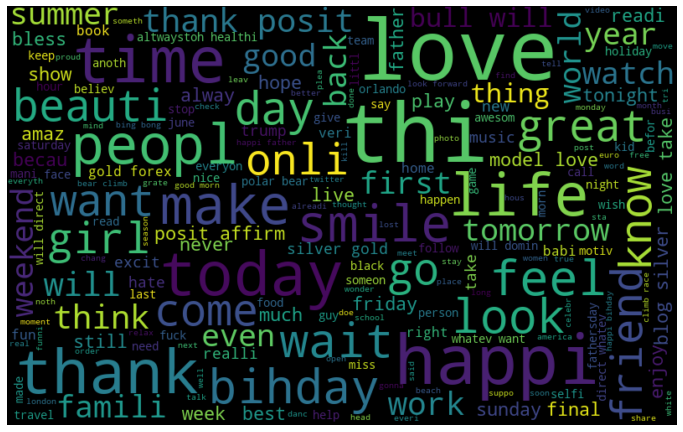

In [18]:
all_words = ' '.join([text for text in combi['tidy_tweet']])

from wordcloud import WordCloud

wordcloud = WordCloud(width = 800, 
                      height = 500, 
                      random_state = 42, max_font_size = 100).generate(all_words)

plt.figure(figsize=(12,8))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

As you can see above, there are many positive or neutral words. 

So you can't see words referring to racism or sexism. 

Lets separate in different kinds of plots. First we will plot only words about non racism or non sexism and second only words referring to racism or sexism.

### Common words on Tweets that don't refer to politics, racism or sexism

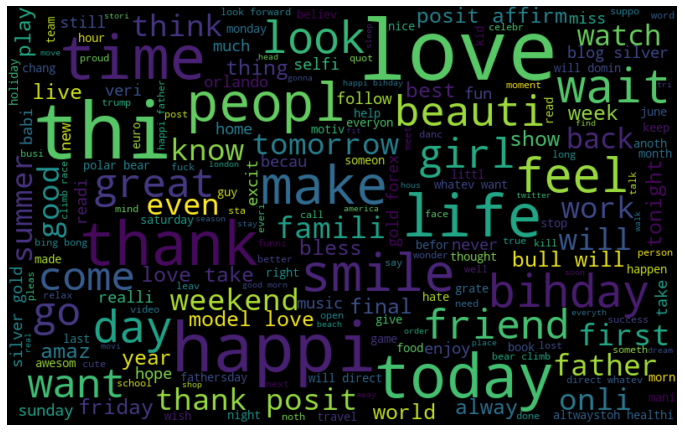

In [19]:
positive_words = ' '.join([text for text in combi[(combi['label'] == 0)]['tidy_tweet']])

from wordcloud import WordCloud

wordcloud = WordCloud(width = 800, 
                      height = 500, 
                      random_state = 42, max_font_size = 100).generate(positive_words)

plt.figure(figsize=(12,8))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

The figure above shows positive and neutral words.

### Common words on Tweets that refer to politics, racism or sexism

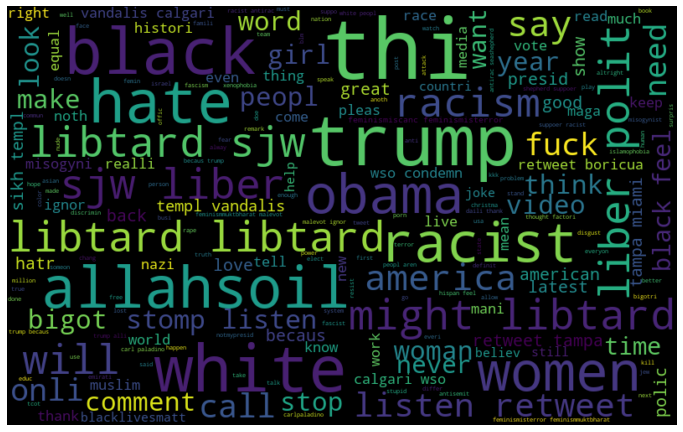

In [20]:
negative_words = ' '.join([text for text in combi[(combi['label'] == 1)]['tidy_tweet']])

from wordcloud import WordCloud

wordcloud = WordCloud(width = 800, 
                      height = 500, 
                      random_state = 42, max_font_size = 100).generate(negative_words)

plt.figure(figsize=(12,8))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

Now, the figure above shows some words about race, sexism or political opinion. Lets see what kinds of hashtags there are on tweets.

### Impacts of hashtags on tweets sentiments

In [21]:
# creating a function to take hashtags:

def hashtag_take(x):
    
    hashtags = []
    
    for i in x:
        
        ht = re.findall(r'#(\w+)', i)
        
        hashtags.append(ht)
        
    return hashtags

In [22]:
# Taking hashtags non racist or non sexism

HT_positive = hashtag_take(combi[(combi['label'] == 0)]['tidy_tweet'])
HT_positive

[['run'],
 ['lyft', 'disapoint', 'getthank'],
 [],
 ['model'],
 ['motiv'],
 ['allshowandnogo'],
 [],
 ['school', 'exam', 'hate', 'imagin', 'actorslif', 'revolutionschool', 'girl'],
 ['allin', 'cav', 'champion', 'cleveland', 'clevelandcavali'],
 [],
 ['ireland', 'blog', 'silver', 'gold', 'forex'],
 ['orlando',
  'standwithorlando',
  'pulseshoot',
  'orlandoshoot',
  'biggerproblem',
  'selfish',
  'heabreak',
  'valu',
  'love'],
 ['gettingf'],
 ['got', 'junior', 'yugyoem', 'omg'],
 ['thank', 'posit'],
 ['friday', 'cooki'],
 [],
 ['euro'],
 ['badday', 'coneofsham', 'cat', 'piss', 'funni', 'laugh'],
 ['wine', 'weekend'],
 ['tgif', 'gamedev', 'indiedev', 'indiegamedev', 'squad'],
 ['upsideofflorida', 'shopalyssa', 'love'],
 ['smile', 'media', 'pressconfer', 'antalya', 'turkey', 'throwback'],
 ['ica'],
 [],
 ['rip', 'orlando'],
 [],
 ['alohafriday', 'time', 'not', 'exist', 'positivevib', 'hawaiian'],
 [],
 ['goodnight', 'badmonday'],
 ['taylorswift'],
 ['travelingram', 'dalat', 'ripinkyli

In [23]:
# Unnesting list about HT_positive

HT_positive = sum(HT_positive, [])
HT_positive

['run',
 'lyft',
 'disapoint',
 'getthank',
 'model',
 'motiv',
 'allshowandnogo',
 'school',
 'exam',
 'hate',
 'imagin',
 'actorslif',
 'revolutionschool',
 'girl',
 'allin',
 'cav',
 'champion',
 'cleveland',
 'clevelandcavali',
 'ireland',
 'blog',
 'silver',
 'gold',
 'forex',
 'orlando',
 'standwithorlando',
 'pulseshoot',
 'orlandoshoot',
 'biggerproblem',
 'selfish',
 'heabreak',
 'valu',
 'love',
 'gettingf',
 'got',
 'junior',
 'yugyoem',
 'omg',
 'thank',
 'posit',
 'friday',
 'cooki',
 'euro',
 'badday',
 'coneofsham',
 'cat',
 'piss',
 'funni',
 'laugh',
 'wine',
 'weekend',
 'tgif',
 'gamedev',
 'indiedev',
 'indiegamedev',
 'squad',
 'upsideofflorida',
 'shopalyssa',
 'love',
 'smile',
 'media',
 'pressconfer',
 'antalya',
 'turkey',
 'throwback',
 'ica',
 'rip',
 'orlando',
 'alohafriday',
 'time',
 'not',
 'exist',
 'positivevib',
 'hawaiian',
 'goodnight',
 'badmonday',
 'taylorswift',
 'travelingram',
 'dalat',
 'ripinkylif',
 'photoshop',
 'enoughisenough',
 'dontph

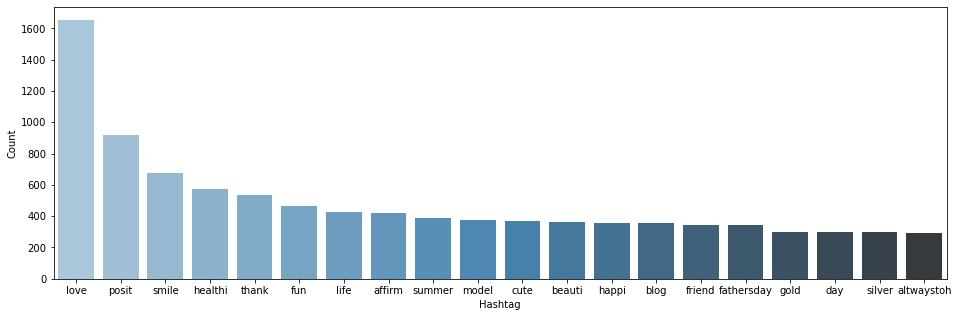

In [24]:
# Plotting barchart from top 20 hashtags most used in tweets not referring to racism or sexism

a = nltk.FreqDist(HT_positive)

d = pd.DataFrame({'Hashtag':list(a.keys()), 
                  'Count': list(a.values())
                 })

d = d.nlargest(columns = 'Count', 
               n = 20
              )

plt.figure(figsize=(16,5))


ax = sns.barplot(data = d, x = 'Hashtag', y = 'Count', palette = 'Blues_d')
ax.set(ylabel = 'Count')

plt.show()

In [25]:
# Taking hashtags referring to racism or sexism

HT_negative = hashtag_take(combi[(combi['label'] == 1)]['tidy_tweet'])
HT_negative

[['cnn', 'michigan', 'tcot'],
 ['australia',
  'opkillingbay',
  'seashepherd',
  'helpcovedolphin',
  'thecov',
  'helpcovedolphin'],
 [],
 [],
 ['neverump', 'xenophobia'],
 ['love', 'peac'],
 [],
 ['race', 'ident', 'med'],
 ['altright', 'whitesupremaci'],
 ['linguist', 'race', 'power', 'raciolinguist'],
 ['brexit'],
 ['peopl', 'trump', 'republican'],
 ['michelleobama'],
 ['knick', 'golf'],
 ['jewishsupremacist'],
 ['libtard', 'sjw', 'liber', 'polit'],
 ['trash', 'hate'],
 [],
 [],
 ['stereotyp', 'prejudic', 'hope', 'hate', 'conflict'],
 ['pol', 'bluelivesmatt', 'draintheswamp', 'ferguson'],
 [],
 ['antisemit', 'hocoschool', 'columbiamd', 'hocomd'],
 ['nazi', 'hatr', 'bigotri'],
 ['libtard', 'sjw', 'liber', 'polit'],
 ['fyi', 'tcot'],
 ['topoli'],
 ['blacklivesmatt'],
 ['ushistori', 'eugen'],
 ['biher', 'bigotri', 'altright', 'potu', 'theresist'],
 ['crime', 'offic'],
 [],
 ['black', 'retweet', 'tampa', 'miami'],
 ['allahsoil'],
 [],
 ['prais', 'cleveland', 'rnc', 'white', 'tamirric',

In [26]:
# Unnesting list about HT_negative

HT_negative = sum(HT_negative, [])
HT_negative

['cnn',
 'michigan',
 'tcot',
 'australia',
 'opkillingbay',
 'seashepherd',
 'helpcovedolphin',
 'thecov',
 'helpcovedolphin',
 'neverump',
 'xenophobia',
 'love',
 'peac',
 'race',
 'ident',
 'med',
 'altright',
 'whitesupremaci',
 'linguist',
 'race',
 'power',
 'raciolinguist',
 'brexit',
 'peopl',
 'trump',
 'republican',
 'michelleobama',
 'knick',
 'golf',
 'jewishsupremacist',
 'libtard',
 'sjw',
 'liber',
 'polit',
 'trash',
 'hate',
 'stereotyp',
 'prejudic',
 'hope',
 'hate',
 'conflict',
 'pol',
 'bluelivesmatt',
 'draintheswamp',
 'ferguson',
 'antisemit',
 'hocoschool',
 'columbiamd',
 'hocomd',
 'nazi',
 'hatr',
 'bigotri',
 'libtard',
 'sjw',
 'liber',
 'polit',
 'fyi',
 'tcot',
 'topoli',
 'blacklivesmatt',
 'ushistori',
 'eugen',
 'biher',
 'bigotri',
 'altright',
 'potu',
 'theresist',
 'crime',
 'offic',
 'black',
 'retweet',
 'tampa',
 'miami',
 'allahsoil',
 'prais',
 'cleveland',
 'rnc',
 'white',
 'tamirric',
 'rip',
 'bigot',
 'blacklivesmatt',
 'feminismiscanc

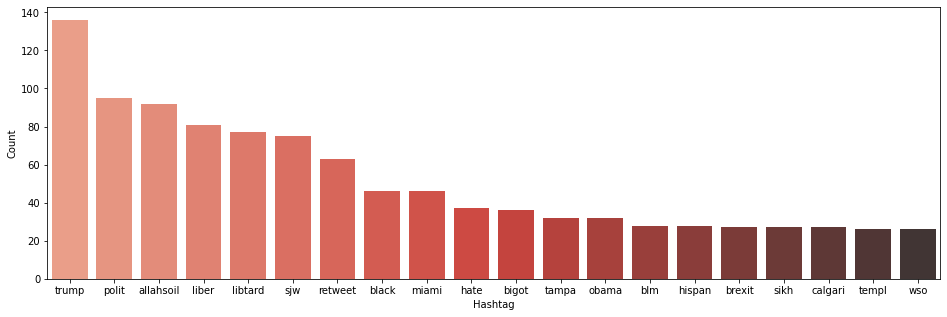

In [27]:
# Plotting barchart from top 20 hashtags most used in tweets referring to racism or sexism

b = nltk.FreqDist(HT_negative)

d = pd.DataFrame({'Hashtag':list(b.keys()), 
                  'Count': list(b.values())
                 })

d = d.nlargest(columns = 'Count', 
               n = 20
              )

plt.figure(figsize=(16,5))


ax = sns.barplot(data = d, x = 'Hashtag', y = 'Count', palette = 'Reds_d')
ax.set(ylabel = 'Count')

plt.show()

### There are some ways to analyse words converting into features:
    
### 1) Bag-of-words Features

### 2) TF-IDF Features

### 3) Word2Vec Features

### Lets see them:




### 1) Bag-of-words Features

In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

bow_vectorizer = CountVectorizer(max_df = 0.90, 
                                 min_df = 2, 
                                 max_features = 1000, 
                                 stop_words = 'english'
                                )

bow = bow_vectorizer.fit_transform(combi['tidy_tweet'])
print(bow)

  (0, 302)	1
  (0, 463)	1
  (0, 738)	1
  (1, 879)	1
  (1, 131)	1
  (1, 600)	1
  (2, 79)	1
  (3, 557)	1
  (3, 518)	1
  (3, 888)	1
  (4, 566)	1
  (5, 423)	1
  (5, 858)	1
  (5, 69)	1
  (5, 485)	1
  (6, 121)	1
  (6, 894)	1
  (7, 749)	2
  (7, 992)	2
  (7, 283)	2
  (7, 883)	1
  (7, 393)	1
  (7, 432)	1
  (7, 353)	1
  (8, 518)	1
  :	:
  (49154, 87)	1
  (49155, 498)	1
  (49155, 307)	1
  (49155, 961)	1
  (49155, 246)	1
  (49156, 891)	1
  (49156, 498)	1
  (49156, 605)	1
  (49156, 980)	2
  (49156, 929)	1
  (49156, 411)	1
  (49156, 122)	1
  (49157, 389)	1
  (49157, 981)	2
  (49157, 175)	1
  (49157, 728)	1
  (49157, 553)	2
  (49157, 480)	1
  (49157, 198)	1
  (49157, 226)	1
  (49157, 612)	1
  (49158, 333)	1
  (49158, 799)	1
  (49158, 243)	1
  (49158, 356)	1


### 2) TF-IDF Features

In [29]:
tfidf_vectorizer = TfidfVectorizer(max_df = 0.90, 
                                   min_df = 2, 
                                   max_features = 1000, 
                                   stop_words = 'english'
                                  )

tfidf = tfidf_vectorizer.fit_transform(combi['tidy_tweet'])
print(tfidf)

  (0, 738)	0.6577413621857342
  (0, 463)	0.5896490179849546
  (0, 302)	0.46871135687055143
  (1, 600)	0.6835218920644196
  (1, 131)	0.6145629375807904
  (1, 879)	0.3938403468675415
  (2, 79)	1.0
  (3, 888)	0.5572995329862621
  (3, 518)	0.44016705593507854
  (3, 557)	0.7040384885805177
  (4, 566)	1.0
  (5, 485)	0.4652198168550412
  (5, 69)	0.4637175931713698
  (5, 858)	0.4743403266916206
  (5, 423)	0.586120951905663
  (6, 894)	0.5868769751051355
  (6, 121)	0.809676118019697
  (7, 353)	0.19785820398515808
  (7, 432)	0.298367397816037
  (7, 393)	0.22953868678391207
  (7, 883)	0.20713435439054187
  (7, 283)	0.6221668428341786
  (7, 992)	0.40382612331421974
  (7, 749)	0.47546741144240784
  (8, 132)	0.689689021511751
  :	:
  (49154, 728)	0.293909942896328
  (49155, 246)	0.6332778044821932
  (49155, 961)	0.532509130693973
  (49155, 307)	0.412937926376108
  (49155, 498)	0.38062516605968433
  (49156, 122)	0.3818217223390089
  (49156, 411)	0.37375293461862846
  (49156, 929)	0.30556509026170586
 

### 3) Word2Vec Features 

Word2Vec Features is better than Bag-of-words Features and TF-IDF Features because:

1) Dimensionality reduction: significant reduction in the numbers of features to develop a model

2) Caputure semantic relationships and meaning of words in different kinds of contexts.

In [30]:
tokenized_tweets = combi['tidy_tweet'].apply(lambda x: x.split())

model_w2v = gensim.models.Word2Vec(
                                    tokenized_tweets, 
                                    size = 200,         # number of features 
                                    window = 5,         # context window size
                                    min_count = 2, 
                                    sg = 1,             # 1 for skip-gram model
                                    hs = 0, 
                                    negative = 10,      # for negative sampling
                                    workers = 2,        # number of core
                                    seed = 42
                                  )

model_w2v.train(
                tokenized_tweets, 
                total_examples = len(combi['tidy_tweet']), 
                epochs = 20
               )

(6509813, 7536020)

In [31]:
# finding the most similar words from the word dinner

model_w2v.wv.most_similar(positive = 'dinner')

[('#cellar', 0.5845494270324707),
 ('spaghetti', 0.5785516500473022),
 ('cookout', 0.5783677101135254),
 ('#avocado', 0.5646408200263977),
 ('#biall', 0.5547709465026855),
 ('#lovefood', 0.5377176403999329),
 ('dess', 0.5369017720222473),
 ('burrito', 0.5346904397010803),
 ('lukey', 0.5335854291915894),
 ('noodl', 0.5331799387931824)]

In [32]:
# finding the most similar words from the word trump

model_w2v.wv.most_similar(positive = 'trump')

[('donald', 0.5870222449302673),
 ('endors', 0.5498794913291931),
 ('phoni', 0.541894793510437),
 ('unstabl', 0.5372217893600464),
 ('jibe', 0.5359224081039429),
 ('unfavor', 0.5331805348396301),
 ('melo', 0.5296950340270996),
 ('potu', 0.5278641581535339),
 ('tomlin', 0.5278109312057495),
 ('commi', 0.5227348208427429)]

In [33]:
# checking the vector representation of any word from our corpus

model_w2v['food']

array([-5.52440621e-03,  8.08352351e-01, -3.27454299e-01, -2.86049038e-01,
        6.73351109e-01,  6.31561816e-01,  1.86475515e-01, -1.68548495e-01,
       -8.49316418e-01, -2.35120431e-01,  2.53706515e-01, -6.52924657e-01,
        1.30305188e-02, -5.06824017e-01,  3.46881986e-01, -8.53550017e-01,
       -9.05126035e-01,  1.12234853e-01, -5.16649783e-01,  8.12661827e-01,
       -2.59156972e-01,  1.18041243e-02, -3.41559112e-01,  8.89006317e-01,
        5.62769830e-01, -6.19208753e-01,  5.06278694e-01, -1.81686267e-01,
       -1.18292049e-01, -1.09960638e-01, -4.36482951e-02,  1.12602271e-01,
        7.46976316e-01,  2.15687811e-01,  3.72625500e-01,  4.18732882e-01,
       -3.59466493e-01,  5.83211362e-01, -3.06868762e-01, -3.40812095e-02,
       -1.61361352e-01, -1.44982055e-01,  3.75308335e-01, -1.02351718e-01,
        1.29889518e-01, -1.80377632e-01, -3.55271902e-03, -5.18577814e-01,
       -7.53391981e-01,  2.32876137e-01, -3.51768970e-01, -5.70734501e-01,
       -8.97084653e-01,  

In [34]:
len(model_w2v['food'])

200

In [35]:
# Creating a function to do a vector for each tweeter by taking the average of the vectors of the words present in each twwet

def word_vector(tokens, size):
    
    vec = np.zeros(size).reshape((1, size))
    
    count = 0
    
    for word in tokens:
        
        try:
            
            vec += model_w2v[word].reshape((1, size))
            
            count += 1
            
        except KeyError: # Handling when token isn't in vocabulary
            
            continue
            
    if count != 0:
            
        vec /= count
            
    return vec

In [36]:
# Preparing Word2Vec feature set

wordvec_arrays = np.zeros((len(tokenized_tweets), 200))

for i in range(len(tokenized_tweets)):
    
    wordvec_arrays[i,:] = word_vector(tokenized_tweets[i], 200)
    
    wordvec_df = pd.DataFrame(wordvec_arrays) 
    
wordvec_df.shape

(49159, 200)

#### Testing some models and choose the model with the best performance:

#### 1) Logistic Regression

#### 2) Support Vector Machine (SVM)

#### 3) Random Forest

#### 4) XGBoost

# 1) Logistic Regression

### 1.1) Logistic Regression with Bag-of-words Features

In [37]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score        # F1 Score was chosen because this dataset is imbalanced

# Extracting training set and test set from bow features
train_bow = bow[:31962, :]
test_bow = bow[31962:,:]

# Split into training set and validation set
x_train_bow, x_val_bow, y_train, y_val =  train_test_split(train_bow, train['label'], random_state = 42, test_size = 0.30)

# Classifier
lreg = LogisticRegression()

# Training the model
lreg.fit(x_train_bow, y_train)

# Predicting with test set
prediction = lreg.predict_proba(x_val_bow)

prediction_int = prediction[:,1] >= 0.3  # 0.3 is the treshold, so if prediction greater than or equal to 0.3 than 1 else 0

prediction_int = prediction_int.astype(np.int)

# Calculating F1 Score
print('f1_score with x_test = ' + round(f1_score(y_val, prediction_int),3).astype(str))

f1_score with x_test = 0.53


### 1.2) Logistic Regression with TF-IDF Features

In [38]:
train_tfidf = tfidf[:31962,:]
test_tfidf = tfidf[31962:,:]

x_train_tfidf = train_tfidf[y_train.index]
x_val_tfidf = train_tfidf[y_val.index]

lreg.fit(x_train_tfidf, y_train)
prediction = lreg.predict_proba(x_val_tfidf)

prediction_int = prediction[:,1] >= 0.3  # 0.3 is the treshold, so if prediction greater than or equal to 0.3 than 1 else 0
prediction_int = prediction_int.astype(np.int)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction_int),3).astype(str))

f1_score with x_test = 0.545


### 1.3) Logistic Regression with Word2Vec Features

In [39]:
train_w2v = wordvec_df.iloc[:31962,:]
test_w2v = wordvec_df.iloc[31962:,:]

x_train_w2v = wordvec_df.iloc[y_train.index,:]
x_val_w2v = wordvec_df.iloc[y_val.index,:]

lreg.fit(x_train_w2v, y_train)
prediction = lreg.predict_proba(x_val_w2v)

prediction_int = prediction[:,1] >= 0.3  # 0.3 is the treshold, so if prediction greater than or equal to 0.3 than 1 else 0
prediction_int = prediction_int.astype(np.int)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction_int),3).astype(str))

f1_score with x_test = 0.611


# 2) Support Vector Machine (SVM)

### 2.1) Support Vector Machine (SVM) with Bag-of-words Features

In [40]:
# Classifier

from sklearn import svm

svc = svm.SVC(kernel = 'linear', C = 1, probability = True).fit(x_train_bow, y_train)
prediction = svc.predict_proba(x_val_bow)

prediction_int = prediction[:,1] >= 0.3  # 0.3 is the treshold, so if prediction greater than or equal to 0.3 than 1 else 0
prediction_int = prediction_int.astype(np.int)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction_int),3).astype(str))

f1_score with x_test = 0.507


### 2.2) Support Vector Machine (SVM) with TF-IDF Features

In [41]:
svc = svm.SVC(kernel = 'linear', C = 1, probability = True).fit(x_train_tfidf, y_train)
prediction = svc.predict_proba(x_val_tfidf)

prediction_int = prediction[:,1] >= 0.3  # 0.3 is the treshold, so if prediction greater than or equal to 0.3 than 1 else 0
prediction_int = prediction_int.astype(np.int)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction_int),3).astype(str))

f1_score with x_test = 0.51


### 2.3) Support Vector Machine (SVM) with Word2Vec Features

In [42]:
svc = svm.SVC(kernel = 'linear', C = 1, probability = True).fit(x_train_w2v, y_train)
prediction = svc.predict_proba(x_val_w2v)

prediction_int = prediction[:,1] >= 0.3  # 0.3 is the treshold, so if prediction greater than or equal to 0.3 than 1 else 0
prediction_int = prediction_int.astype(np.int)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction_int),3).astype(str))

f1_score with x_test = 0.611


# 3) Random Forest Classifier

### 3.1) Random Forest Classifier with Bag-of-words Features

In [43]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators = 400, random_state = 42).fit(x_train_bow, y_train)
prediction = rf.predict(x_val_bow)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction),3).astype(str))

f1_score with x_test = 0.549


### 3.2) Random Forest Classifier with TF-IDF Features

In [44]:
rf = RandomForestClassifier(n_estimators = 400, random_state = 42).fit(x_train_tfidf, y_train)
prediction = rf.predict(x_val_tfidf)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction),3).astype(str))

f1_score with x_test = 0.565


### 3.3) Random Forest Classifier with Word2Vec Features

In [45]:
rf = RandomForestClassifier(n_estimators = 400, random_state = 42).fit(x_train_w2v, y_train)
prediction = rf.predict(x_val_w2v)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction),3).astype(str))

f1_score with x_test = 0.495


# 4) XGBoost

There are some benefits when you apply XGBoost:

1) Regularization: it helps reducing overfitting

2) Parallel Processing: it implements parallel processing and it is faster than Gradient Boosting Machine

3) Handling Missing Values: it has as in-built function to handle missing values

4) Built-in Cross Validation: run a cross-validation for each iteration from boosting process.

### 4.1) XGBoost with Bag-of-words Features

In [46]:
from xgboost import XGBClassifier

xgb_model = XGBClassifier(max_depth = 6, n_estimators = 1000).fit(x_train_bow, y_train)
prediction = xgb_model.predict(x_val_bow)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction),3).astype(str))

f1_score with x_test = 0.525


### 4.2) XGBoost with TF-IDF Features

In [47]:
xgb_model = XGBClassifier(max_depth = 6, n_estimators = 1000).fit(x_train_tfidf, y_train)
prediction = xgb_model.predict(x_val_tfidf)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction),3).astype(str))

f1_score with x_test = 0.539


### 4.3) XGBoost with Word2Vec Features

In [48]:
xgb_model = XGBClassifier(max_depth = 6, n_estimators = 1000).fit(x_train_w2v, y_train)
prediction = xgb_model.predict(x_val_w2v)

print('f1_score with x_test = ' + round(f1_score(y_val, prediction),3).astype(str))

f1_score with x_test = 0.646


### How it was presented above, the most promising model was XGBoost applied with Word2Vec Features.

### Now lets try to tune it.

In [49]:
import xgboost as xgb

# Creating DMatrix with features and the target
dtrain = xgb.DMatrix(x_train_w2v, label = y_train)
dval = xgb.DMatrix(x_val_w2v, label = y_val)
dtest = xgb.DMatrix(test_w2v)


# Parameters to tune
params = {'objective' : 'binary:logistic', 
          'max_depth' : 6, 
          'min_child_weight' : 1, 
          'eta' : .3, 
          'subsample' : 1, 
          'colsample_bytree' : 1
         }

# Creating a custom evaluation metric to calculate F1 Score
def custom_eval(preds, dtrain):
    labels = dtrain.get_label().astype(np.int)
    preds = (preds >= 0.3).astype(np.int)
    return [('f1_score', f1_score(labels, preds))]

In [50]:
# Tuning max_depth and min_child_wight
gridsearch_params = [(max_depth, min_child_weight) 
                     for max_depth in range(6,10) 
                     for min_child_weight in range(5,8)]

# Starting with zero
max_f1 = 0
best_params = None

for max_depth, min_child_weight in gridsearch_params:
    print('CV with max_depth={}, min_child_weight={}'.format(max_depth, min_child_weight))
    
    params['max_depth'] = max_depth                     #update parameter max_depth
    params['min_child_weight'] = min_child_weight       #update parameter min_child_weight
    
    cv_results = xgb.cv(params, 
                        dtrain, 
                        feval = custom_eval, 
                        num_boost_round = 200, 
                        maximize = True, 
                        seed = 42, 
                        nfold = 5, 
                        early_stopping_rounds = 10
                       )
    
# Finding best F1 Score
    mean_f1 = cv_results['test-f1_score-mean'].max()

    boost_rounds = cv_results['test-f1_score-mean'].argmax()

    print('\tF1 Score {} for {} rounds'.format(mean_f1, boost_rounds))

    if mean_f1 > max_f1:

        max_f1 = mean_f1

        best_params = (max_depth, min_child_weight)
    
print('Best params: {}, {}, F1 Score: {}'.format(best_params[0], best_params[1], max_f1))

CV with max_depth=6, min_child_weight=5
	F1 Score 0.6252942 for 56 rounds
CV with max_depth=6, min_child_weight=6
	F1 Score 0.6420578 for 91 rounds
CV with max_depth=6, min_child_weight=7
	F1 Score 0.631715 for 90 rounds
CV with max_depth=7, min_child_weight=5
	F1 Score 0.621401 for 52 rounds
CV with max_depth=7, min_child_weight=6
	F1 Score 0.6221096 for 52 rounds
CV with max_depth=7, min_child_weight=7
	F1 Score 0.6298028 for 81 rounds
CV with max_depth=8, min_child_weight=5
	F1 Score 0.6114002 for 45 rounds
CV with max_depth=8, min_child_weight=6
	F1 Score 0.6201578 for 54 rounds
CV with max_depth=8, min_child_weight=7
	F1 Score 0.6313724 for 62 rounds
CV with max_depth=9, min_child_weight=5
	F1 Score 0.6264367999999999 for 68 rounds
CV with max_depth=9, min_child_weight=6
	F1 Score 0.6388170000000001 for 70 rounds
CV with max_depth=9, min_child_weight=7
	F1 Score 0.6330364 for 87 rounds
Best params: 6, 6, F1 Score: 0.6420578


In [51]:
# Updating parameters max_depth and min_child_weight with the best params presented above
params['max_depth'] = best_params[0]
params['min_child_weight'] = best_params[1]

# Tuning subsample and colsample
gridsearch_params = [(subsample, colsample) 
                     for subsample in [i/10. for i in range(5,10)]  
                     for colsample in [i/10. for i in range(5,10)]]

# Starting with zero
max_f1 = 0
best_params = None

for subsample, colsample in gridsearch_params:
    
    print('CV with subsample = {}, colsample = {}'.format(subsample, colsample))
    
    params['subsample'] = subsample                            #update parameter subsample
    params['colsample_bytree'] = colsample                     #update parameter colsample_bytree
    
    cv_results = xgb.cv(params, 
                        dtrain, 
                        feval = custom_eval, 
                        num_boost_round = 200, 
                        maximize = True, 
                        seed = 42, 
                        nfold = 5, 
                        early_stopping_rounds = 10
                       )
    
# Finding best F1 Score
    mean_f1 = cv_results['test-f1_score-mean'].max()

    boost_rounds = cv_results['test-f1_score-mean'].argmax()

    print('\tF1 Score {} for {} rounds'.format(mean_f1, boost_rounds))

    if mean_f1 > max_f1:

        max_f1 = mean_f1

        best_params = (subsample, colsample)
    
print('Best params: {}, {}, F1 Score: {}'.format(best_params[0], best_params[1], max_f1))

CV with subsample = 0.5, colsample = 0.5
	F1 Score 0.6082150000000001 for 64 rounds
CV with subsample = 0.5, colsample = 0.6
	F1 Score 0.628142 for 84 rounds
CV with subsample = 0.5, colsample = 0.7
	F1 Score 0.6115548000000001 for 44 rounds
CV with subsample = 0.5, colsample = 0.8
	F1 Score 0.6301006 for 79 rounds
CV with subsample = 0.5, colsample = 0.9
	F1 Score 0.621103 for 61 rounds
CV with subsample = 0.6, colsample = 0.5
	F1 Score 0.6227912 for 82 rounds
CV with subsample = 0.6, colsample = 0.6
	F1 Score 0.6436932000000001 for 121 rounds
CV with subsample = 0.6, colsample = 0.7
	F1 Score 0.6257322 for 84 rounds
CV with subsample = 0.6, colsample = 0.8
	F1 Score 0.615046 for 45 rounds
CV with subsample = 0.6, colsample = 0.9
	F1 Score 0.637258 for 79 rounds
CV with subsample = 0.7, colsample = 0.5
	F1 Score 0.62937 for 97 rounds
CV with subsample = 0.7, colsample = 0.6
	F1 Score 0.6061272 for 46 rounds
CV with subsample = 0.7, colsample = 0.7
	F1 Score 0.5985426 for 34 rounds
CV 

In [52]:
# Updating parameters subsample and colsample_bytree with the best params presented above
params['subsample'] = best_params[0]
params['colsample_bytree'] = best_params[1]

# Tuning learning rate
max_f1 = 0
best_params = None

for eta in [.3, .2, .1, .05, .01, .005]:
    
    print('CV with eta = {}'.format(eta))
    
    params['eta'] = eta                       #update parameter eta
        
    cv_results = xgb.cv(params, 
                        dtrain, 
                        feval = custom_eval, 
                        num_boost_round = 200, 
                        maximize = True, 
                        seed = 42, 
                        nfold = 5, 
                        early_stopping_rounds = 20
                       )
    
    # Finding best F1 Score
    mean_f1 = cv_results['test-f1_score-mean'].max()

    boost_rounds = cv_results['test-f1_score-mean'].argmax()

    print('\tF1 Score {} for {} rounds'.format(mean_f1, boost_rounds))

    if mean_f1 > max_f1:

        max_f1 = mean_f1

        best_params = (eta)
    
print('Best params: {}, F1 Score: {}'.format(best_params, max_f1))

CV with eta = 0.3
	F1 Score 0.6468924 for 97 rounds
CV with eta = 0.2
	F1 Score 0.6410584 for 153 rounds
CV with eta = 0.1
	F1 Score 0.638218 for 197 rounds
CV with eta = 0.05
	F1 Score 0.6024722 for 196 rounds
CV with eta = 0.01
	F1 Score 0.4132198000000001 for 198 rounds
CV with eta = 0.005
	F1 Score 0.0 for 0 rounds
Best params: 0.3, F1 Score: 0.6468924


In [53]:
# Updating parameter eta with the best parameter presented above
params['eta'] = best_params

# Parameters tuned
params

{'objective': 'binary:logistic',
 'max_depth': 6,
 'min_child_weight': 6,
 'eta': 0.3,
 'subsample': 0.8,
 'colsample_bytree': 0.9}

In [54]:
# Using tuned parameters on model
xgb_model = xgb.train(params, 
                      dtrain, 
                      feval = custom_eval, 
                      num_boost_round = 1000, 
                      maximize = True, 
                      evals = [(dval, 'Validation')], 
                      early_stopping_rounds=10
                     )

[0]	Validation-error:0.06414	Validation-f1_score:0.19744
Multiple eval metrics have been passed: 'Validation-f1_score' will be used for early stopping.

Will train until Validation-f1_score hasn't improved in 10 rounds.
[1]	Validation-error:0.05809	Validation-f1_score:0.28571
[2]	Validation-error:0.05611	Validation-f1_score:0.35198
[3]	Validation-error:0.05465	Validation-f1_score:0.36490
[4]	Validation-error:0.05392	Validation-f1_score:0.37813
[5]	Validation-error:0.05298	Validation-f1_score:0.39686
[6]	Validation-error:0.05308	Validation-f1_score:0.41150
[7]	Validation-error:0.05266	Validation-f1_score:0.43384
[8]	Validation-error:0.05204	Validation-f1_score:0.44635
[9]	Validation-error:0.05110	Validation-f1_score:0.45975
[10]	Validation-error:0.05037	Validation-f1_score:0.47899
[11]	Validation-error:0.04974	Validation-f1_score:0.49639
[12]	Validation-error:0.05027	Validation-f1_score:0.49228
[13]	Validation-error:0.04954	Validation-f1_score:0.50661
[14]	Validation-error:0.04891	Valid

In [55]:
# Predicting with the model and creating the output csv file
test_pred = xgb_model.predict(dtest)
test['label'] = (test_pred >= 0.3).astype(np.int)
output = test[['id', 'label']]
output.to_csv('output_xgboost_word2vec.csv', index = False, sep = ',')

In [56]:
pd.set_option('display.max_rows', 18000)

# DataFrame from output after prediction model
output2 = test[['id', 'label', 'tweet']]
output2

,id,label,tweet
0,31963,0,#studiolife #aislife #requires #passion #dedication #willpower to find #newmaterialsâ¦
1,31964,0,@user #white #supremacists want everyone to see the new â #birdsâ #movie â and hereâs why
2,31965,0,safe ways to heal your #acne!! #altwaystoheal #healthy #healing!!
3,31966,0,"is the hp and the cursed child book up for reservations already? if yes, where? if no, when? ððð #harrypotter #pottermore #favorite"
4,31967,0,"3rd #bihday to my amazing, hilarious #nephew eli ahmir! uncle dave loves you and missesâ¦"
5,31968,0,choose to be :) #momtips
6,31969,0,something inside me dies ð¦ð¿â¨ eyes ness #smokeyeyes #tired #lonely #sof #grungeâ¦
7,31970,0,#finished#tattoo#inked#ink#loveitâ¤ï¸ #â¤ï¸â¤ï¸â¤ï¸â¤ï¸ #thanks#aleeee !!!
8,31971,0,@user @user @user i will never understand why my dad left me when i was so young.... :/ #deep #inthefeels
9,31972,0,#delicious #food #lovelife #capetown mannaepicure #resturantâ¦


In [57]:
# DataFrame after prediction model with tweets referring politician, sexism or race
output2[(output2['label'] == 1)]

,id,label,tweet
19,31982,1,thought factory: bbc neutrality on right wing fascism #politics #media #blm #brexit #trump #leadership &gt;3
26,31989,1,chick gets fucked hottest naked lady
33,31996,1,suppo the #taiji fisherman! no bullying! no racism! #tweet4taiji #thecove #seashepherd
81,32044,1,@user .@user @user @user @user &lt;--- no more feeding at the public trough piggy. #michelleobamaâ¦
110,32073,1,hey @user - a $14000 ivanka bracelet? do you feel good profiting from #xenophobia? #misogyny? #hatred? ? #grabyourwallet
140,32103,1,@user all together this christmas: pls &amp; follow @user national day of action on 20 feb against &amp; theâ¦
141,32104,1,you might be a libtard if... #libtard #sjw #liberal #politics
159,32122,1,#people aren't protesting #trump because a #republican won-they do so because trump has fuhered &amp;â¦
160,32123,1,at work: attorneys for white officer who shot #philandocastile remove black judge from presiding over trial.
161,32124,1,phil spencer criticizes sony? of course! what else would you do when you just got slapped in the face by sony's huge 40 million+ dick!


In [58]:
# DataFrame after prediction model with tweets not referring politician, sexism or race
output2[(output2['label'] == 0)]

,id,label,tweet
0,31963,0,#studiolife #aislife #requires #passion #dedication #willpower to find #newmaterialsâ¦
1,31964,0,@user #white #supremacists want everyone to see the new â #birdsâ #movie â and hereâs why
2,31965,0,safe ways to heal your #acne!! #altwaystoheal #healthy #healing!!
3,31966,0,"is the hp and the cursed child book up for reservations already? if yes, where? if no, when? ððð #harrypotter #pottermore #favorite"
4,31967,0,"3rd #bihday to my amazing, hilarious #nephew eli ahmir! uncle dave loves you and missesâ¦"
5,31968,0,choose to be :) #momtips
6,31969,0,something inside me dies ð¦ð¿â¨ eyes ness #smokeyeyes #tired #lonely #sof #grungeâ¦
7,31970,0,#finished#tattoo#inked#ink#loveitâ¤ï¸ #â¤ï¸â¤ï¸â¤ï¸â¤ï¸ #thanks#aleeee !!!
8,31971,0,@user @user @user i will never understand why my dad left me when i was so young.... :/ #deep #inthefeels
9,31972,0,#delicious #food #lovelife #capetown mannaepicure #resturantâ¦
